In [1]:
# Stop warnings
import warnings
warnings.filterwarnings("ignore")

import os
import sys
import json
import copy
import cortex
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

sys.path.append("{}/../../analysis_code/utils".format(os.getcwd()))
from surface_utils import load_surface
from pycortex_utils import set_pycortex_config_file, load_surface_pycortex, get_rois

In [2]:
with open('../settings.json') as f:
    json_s = f.read()
    analysis_info = json.loads(json_s)
maps_names_css = analysis_info['maps_names_css']

In [3]:
# Import data base
main_dir = '/Users/uriel/disks/meso_shared'
project_dir = 'RetinoMaps'
subject = 'sub-02'

In [4]:
# Set pycortex db and colormaps
cortex_dir = "{}/{}/derivatives/pp_data/cortex".format(main_dir, project_dir)
set_pycortex_config_file(cortex_dir)

In [5]:
# defind indexs 
for idx, col_name in enumerate(maps_names_css):
    exec("{}_idx = idx".format(col_name)) 

# Load TSV

In [10]:
tsv_dir = '{}/{}/derivatives/pp_data/{}/fsnative/prf/tsv'.format(main_dir, project_dir, subject)
tsv_fn = '{}/{}_css-all_derivatives.tsv'.format(tsv_dir, subject)
data = pd.read_table(tsv_fn)

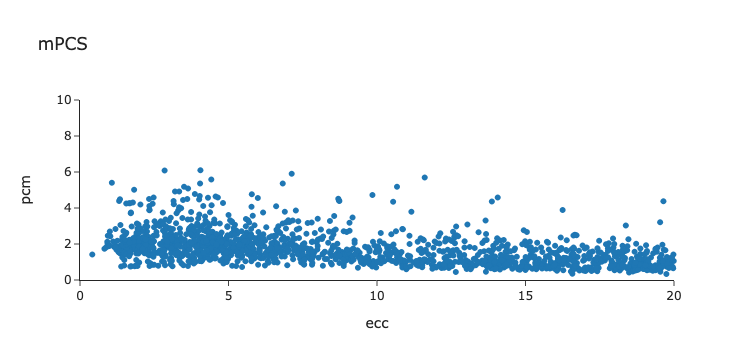

In [21]:
roi = 'mPCS'
data_roi = data.loc[data['roi'] == roi]
# mask data with roi 
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=data_roi['prf_ecc'], 
    y=data_roi['pcm_median'], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='ecc', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='pcm',
                 range=[0, 10], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

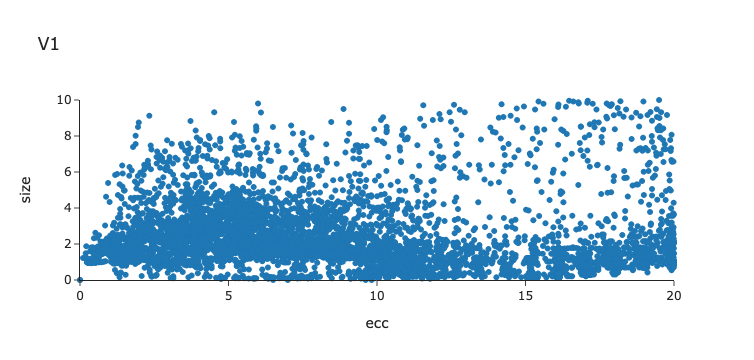

In [19]:
roi = 'V1'
data_roi = data.loc[data['roi'] == roi]
# mask data with roi 
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=data_roi['prf_ecc'], 
    y=data_roi['prf_size'], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='ecc', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='size',
                 range=[0, 10], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

# Load Data

In [6]:
# load data from old vdm fit
prf_fit_dir_old = '{}/{}/derivatives/pp_data/{}/fsnative/prf_old/prf_derivatives'.format(main_dir, project_dir, subject)
prf_fit_fn_L_old = '{}/{}_task-pRF_hemi-L_fmriprep_dct_avg_prf-deriv_css_loo-median.func.gii'.format(prf_fit_dir_old, subject)
prf_fit_fn_R_old = '{}/{}_task-pRF_hemi-R_fmriprep_dct_avg_prf-deriv_css_loo-median.func.gii'.format(prf_fit_dir_old, subject)


deriv_results_old = load_surface_pycortex(L_fn=prf_fit_fn_L_old, R_fn=prf_fit_fn_R_old)
deriv_mat_old = deriv_results_old['data_concat']

# load data from new vdm fit
prf_fit_dir_new = '{}/{}/derivatives/pp_data/{}/fsnative/prf/prf_derivatives'.format(main_dir, project_dir, subject)
prf_fit_fn_L_new = '{}/{}_task-pRF_hemi-L_fmriprep_dct_avg_prf-deriv_css_loo-median.func.gii'.format(prf_fit_dir_new, subject)
prf_fit_fn_R_new = '{}/{}_task-pRF_hemi-R_fmriprep_dct_avg_prf-deriv_css_loo-median.func.gii'.format(prf_fit_dir_new, subject)


deriv_results_new = load_surface_pycortex(L_fn=prf_fit_fn_L_new, R_fn=prf_fit_fn_R_new)
deriv_mat_new = deriv_results_new['data_concat']


In [7]:
# load rois mask
rois_dict = get_rois(subject=subject, return_concat_hemis=True, return_hemi=None, rois=None, mask=True)


# Figures

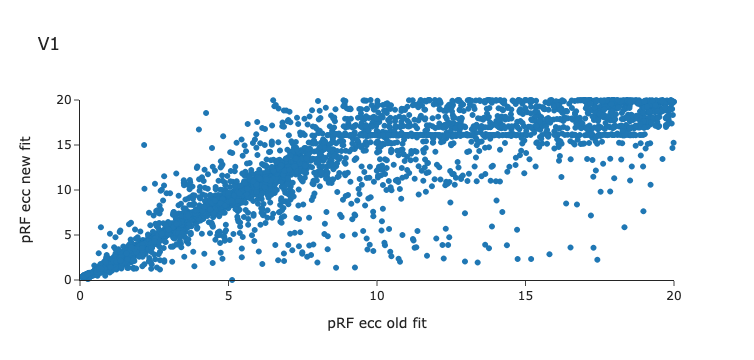

In [9]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_old_roi[prf_ecc_idx, :], 
    y=deriv_mat_new_roi[prf_ecc_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF ecc old fit', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='pRF ecc new fit',
                 range=[0, 20], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

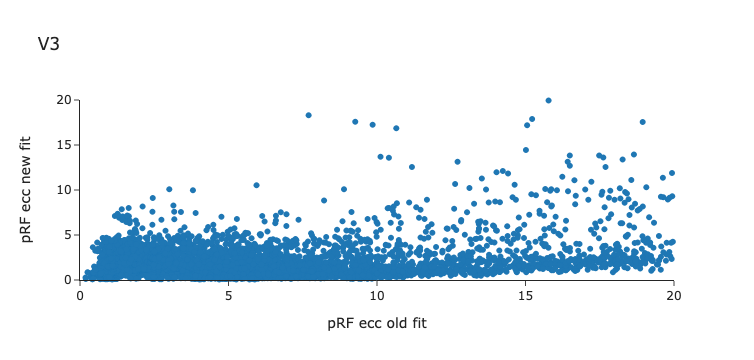

In [16]:
# mask data with roi 
roi = 'V3'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_old_roi[prf_ecc_idx, :], 
    y=deriv_mat_old_roi[prf_size_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF ecc old fit', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='pRF ecc new fit',
                 range=[0, 20], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

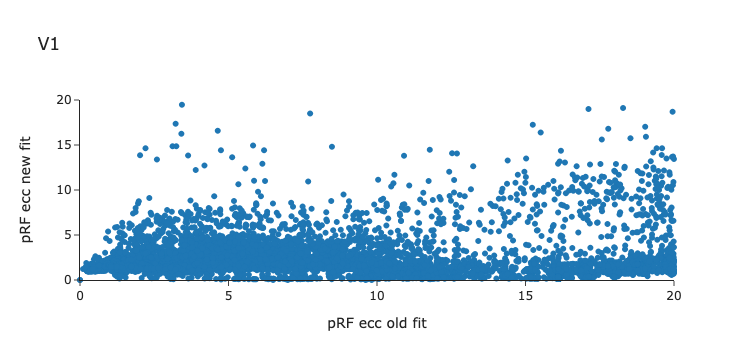

In [18]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_new_roi[prf_ecc_idx, :], 
    y=deriv_mat_new_roi[prf_size_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF ecc old fit', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='pRF ecc new fit',
                 range=[0, 20], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

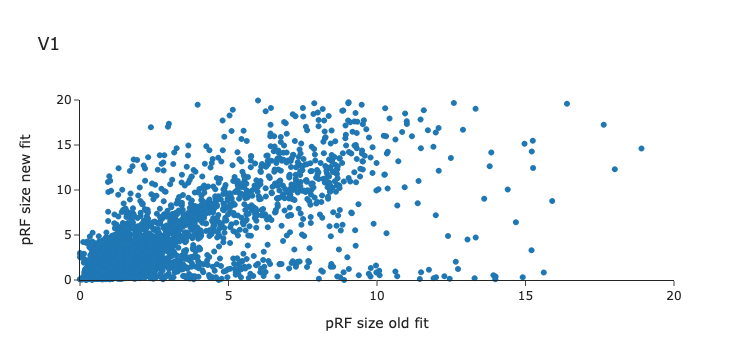

In [11]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_old_roi[prf_size_idx, :], 
    y=deriv_mat_new_roi[prf_size_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF size old fit', 
                 range=[0, 20], 
                 showline=True)

fig.update_yaxes(title_text='pRF size new fit',
                 range=[0, 20], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

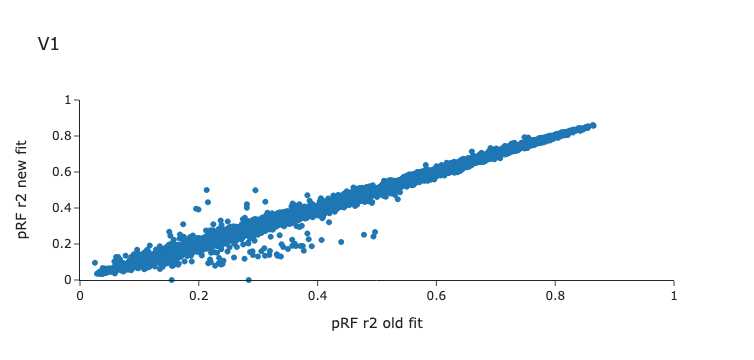

In [12]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_old_roi[prf_rsq_idx, :], 
    y=deriv_mat_new_roi[prf_rsq_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF r2 old fit', 
                 range=[0, 1], 
                 showline=True)

fig.update_yaxes(title_text='pRF r2 new fit',
                 range=[0, 1], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

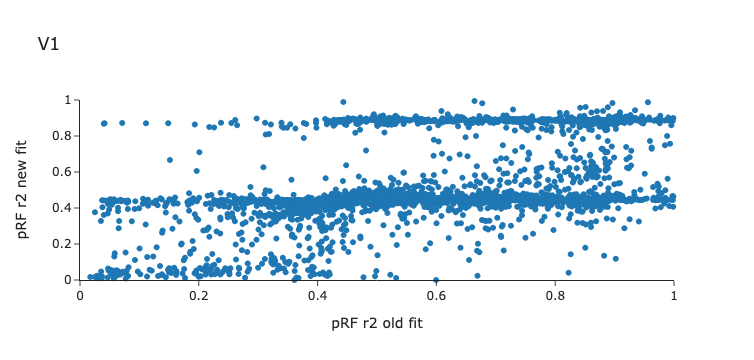

In [15]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=deriv_mat_old_roi[prf_n_idx, :], 
    y=deriv_mat_new_roi[prf_n_idx, :], 
    cliponaxis = False,
    mode='markers'))

fig.update_xaxes(title_text='pRF r2 old fit', 
                 range=[0, 1], 
                 showline=True)

fig.update_yaxes(title_text='pRF r2 new fit',
                 range=[0, 1], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

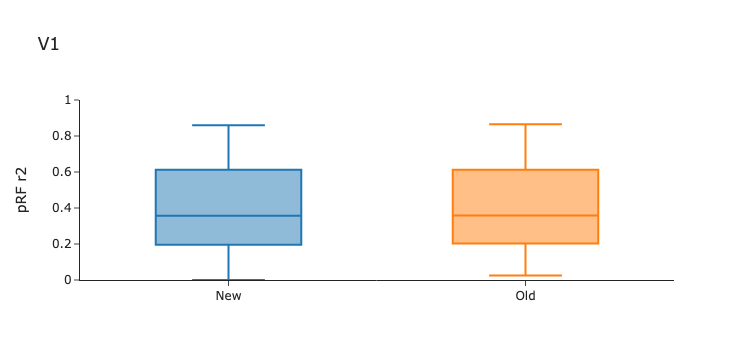

In [13]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Box(
    y=deriv_mat_new_roi[prf_rsq_idx, :], 
    name='New'
    ))
fig.add_trace(go.Box(
    y=deriv_mat_old_roi[prf_rsq_idx, :], 
    name='Old'
    ))


fig.update_yaxes(title_text='pRF r2',
                 range=[0, 1], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

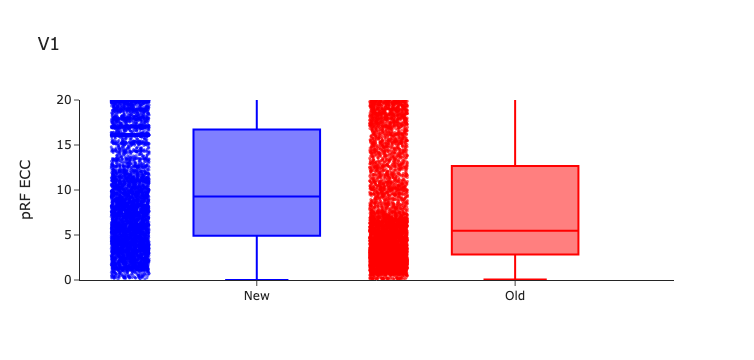

In [20]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Box(
    y=deriv_mat_new_roi[prf_ecc_idx, :],
    name='New',
    boxpoints='all',       # affiche tous les points
    jitter=0.3,            # écarte un peu les points horizontalement
    pointpos=-2,            # position des points par rapport à la boîte
    marker=dict(size=3, opacity=0.6, color='blue'),
    line=dict(color='blue')
))
fig.add_trace(go.Box(
    y=deriv_mat_old_roi[prf_ecc_idx, :],
    name='Old',
    boxpoints='all',
    jitter=0.3,
    pointpos=-2,
    marker=dict(size=3, opacity=0.6, color='red'),
    line=dict(color='red')
))

fig.update_yaxes(title_text='pRF ECC', range=[0, 20], showline=True)
fig.update_layout(
    showlegend=False,
    title_text=f'{roi}',
    template='simple_white'
)

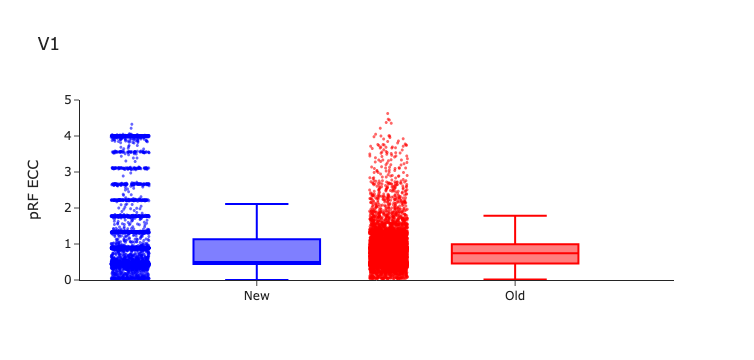

In [9]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Box(
    y=deriv_mat_new_roi[prf_n_idx, :],
    name='New',
    boxpoints='all',       # affiche tous les points
    jitter=0.3,            # écarte un peu les points horizontalement
    pointpos=-2,            # position des points par rapport à la boîte
    marker=dict(size=3, opacity=0.6, color='blue'),
    line=dict(color='blue')
))
fig.add_trace(go.Box(
    y=deriv_mat_old_roi[prf_n_idx, :],
    name='Old',
    boxpoints='all',
    jitter=0.3,
    pointpos=-2,
    marker=dict(size=3, opacity=0.6, color='red'),
    line=dict(color='red')
))

fig.update_yaxes(title_text='pRF ECC', range=[0, 5], showline=True)
fig.update_layout(
    showlegend=False,
    title_text=f'{roi}',
    template='simple_white'
)

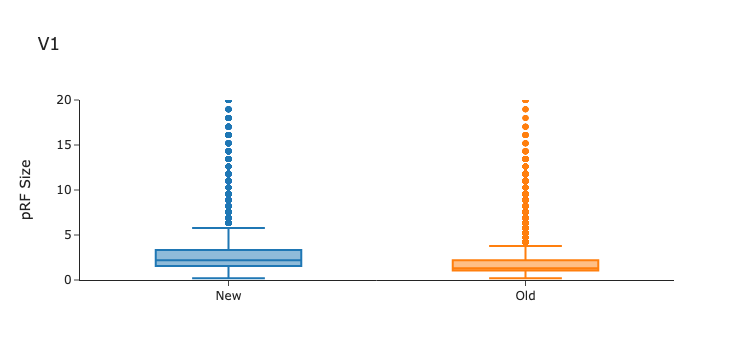

In [26]:
# mask data with roi 
roi = 'V1'
roi_mask = rois_dict[roi]

deriv_mat_old_roi = deriv_mat_old[:, roi_mask]
deriv_mat_new_roi = deriv_mat_new[:, roi_mask]


fig = go.Figure()
fig.add_trace(go.Box(
    y=deriv_mat_new_roi[prf_size_idx, :], 
    name='New'
    ))
fig.add_trace(go.Box(
    y=deriv_mat_old_roi[prf_size_idx, :], 
    name='Old'
    ))


fig.update_yaxes(title_text='pRF Size',
                 range=[0, 20], 
                 showline=True)
fig.update_layout(showlegend=False, 
                  title_text='{}'.format(roi),
                  template='simple_white')

In [43]:
deriv_mat_old_roi.shape

(8, 6678)

AttributeError: 'str' object has no attribute 'shape'

In [44]:
maps_names_gauss

['prf_rsq',
 'prf_ecc',
 'polar_real',
 'polar_imag',
 'prf_size',
 'amplitude',
 'baseline',
 'prf_x',
 'prf_y',
 'hrf_1',
 'hrf_2']